# Inverse UQ of 'a' and 'm' parameter

In [1]:
using Pkg
Pkg.activate("C:/Users/lisah/Documents/Repos/ma-code")

  Activating project at `C:\Users\lisah\Documents\Repos\ma-code`


In [2]:
include("c:/Users/lisah/Documents/Repos/ma-code/src/src.jl")
using .Src

## Infer a,m with fisher inversion

In [3]:
# general setup
prm_keys = [:a, :m]
t_fixed = true
m_true = 0.45
n0_true = 1.5
w0 = 1.0
M = 100
noise = 0.1;

We analyze the identifiability of the following points:
1. a = 0.5, m = 0.45, n0 = 1.5
2. a = 0.9, m = 0.45, n0 = 1.5
3. a = 1.5, m = 0.45, n0 = 1.5

## Practical identifiability

### 1. Left of bifurcation point

In [5]:
a_true = 0.5
hprm = Hyperprm(w0, n0_true, a_true, m_true, M, noise)

# generate true data, i.e. data observations
sol_true = sol_klausmeier(hprm; t_fixed=t_fixed) 
sol_true = randomize_data!(sol_true, hprm.noise); # make data noisy

In [6]:
r1 = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

(mle = [0.5072140973553552, 0.4340196329358796], plot_mles = Plot{Plots.GRBackend() n=12}, plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.41737289487716084; 0.41737289487418 1.0], cov = [0.0010775160338888146 0.0003826201112403083; 0.0003826201112375757 0.0007799438945038184], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plot{Plots.GRBackend() n=2})

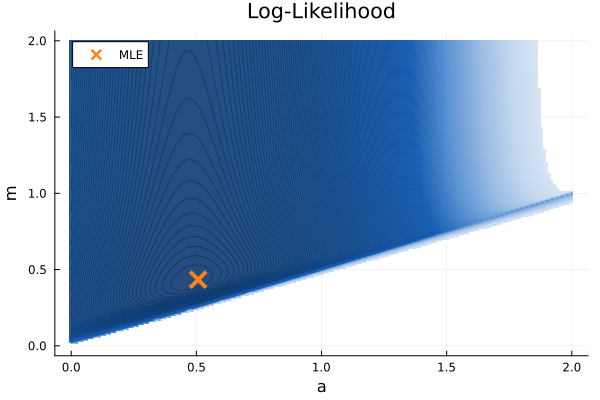

In [8]:
analyze_ll(r1.mle, prm_keys, hprm, -1000, t_fixed=t_fixed)

### 2. At bifurcation point

In [19]:
a_true = 0.9
hprm = Src.Hyperprm(w0, n0_true, a_true, m_true, M, noise)

# generate true data, i.e. data observations
sol_true = Src.sol_klausmeier(hprm; t_fixed=t_fixed) 
sol_true = Src.randomize_data!(sol_true, hprm.noise); # make data noisy

In [20]:
r2 = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

(mle = [0.9125740035285936, 0.45590952069507534], plot_mles = Plot{Plots.GRBackend() n=12}, plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.999417077940125; 0.9994170779401511 1.0], cov = [0.0049041325866896815 0.0024065772801611777; 0.0024065772801612406 0.0011823441007736241], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plot{Plots.GRBackend() n=2})

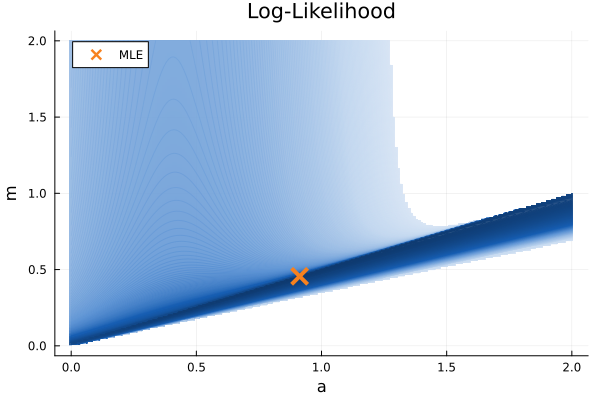

In [21]:
analyze_ll(r2.mle, prm_keys, hprm, -1000, t_fixed=t_fixed)

### 3. Right of bifurcation point

In [22]:
a_true = 1.5
hprm = Src.Hyperprm(w0, n0_true, a_true, m_true, M, noise)

# generate true data, i.e. data observations
sol_true = Src.sol_klausmeier(hprm; t_fixed=t_fixed) 
sol_true = Src.randomize_data!(sol_true, hprm.noise); # make data noisy

In [23]:
r3 = assess_practical_identifiability(prm_keys, hprm, t_fixed=t_fixed)

(mle = [1.5304589490582954, 0.458511756903764], plot_mles = Plot{Plots.GRBackend() n=12}, plot_losses = Plot{Plots.GRBackend() n=3}, cor = [1.0 0.9989798798021514; 0.998979879802143 1.0], cov = [0.08477270128388559 0.025418067645278104; 0.02541806764527789 0.007636872808616961], gaussian_heatmap = Plot{Plots.GRBackend() n=1}, gaussian_surface = Plot{Plots.GRBackend() n=2})

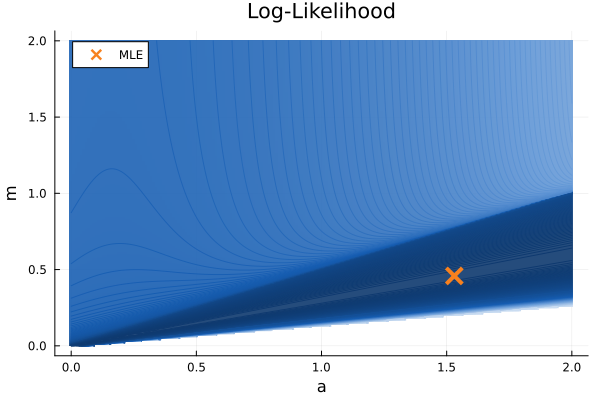

In [28]:
analyze_ll(r3.mle, prm_keys, hprm, -10000, t_fixed=t_fixed)